# Load packages

In [ ]:
!pip install optimum-intel[openvino]
!pip install detoxify

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 424.1/424.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.5/258.5 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import pandas as pd
import numpy as np
import nltk
import string
import openvino.properties.hint as hints
import matplotlib.pyplot as plt
import torch

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.utils import resample
from optimum.intel.openvino import OVModelForSequenceClassification
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from detoxify import Detoxify
from sklearn.metrics import auc, accuracy_score, recall_score, precision_score, f1_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
chunk_size = 100000
train = pd.DataFrame()  # Initialize an empty DataFrame

# Read and concatenate chunks from the file
for chunk in pd.read_csv('/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/train_cleaned.csv', chunksize=chunk_size, engine='python', on_bad_lines='warn', encoding='utf-8'):
  train = pd.concat([train, chunk], ignore_index=True)

# Check total number of rows
print(f"Total rows in combined data: {train.shape[0]}")

Total rows in combined data: 159564


In [ ]:
df_test = pd.DataFrame()  # Initialize an empty DataFrame

# Read and concatenate chunks from the file
for chunk in pd.read_csv('/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/test_cleaned.csv', chunksize=chunk_size, engine='python', on_bad_lines='warn', encoding='utf-8'):
  df_test = pd.concat([df_test, chunk], ignore_index=True)

# Check total number of rows
print(f"Total rows in combined data: {df_test.shape[0]}")

Total rows in combined data: 63969


In [ ]:
df_truth = pd.DataFrame()  # Initialize an empty DataFrame

# Read and concatenate chunks from the file
for chunk in pd.read_csv('/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/label_cleaned.csv', chunksize=chunk_size, engine='python', on_bad_lines='warn', encoding='utf-8'):
  df_truth = pd.concat([df_truth, chunk], ignore_index=True)

# Check total number of rows
print(f"Total rows in combined data: {df_truth.shape[0]}")

Total rows in combined data: 63969


# Test Set Classification


In [ ]:
# extract a random subset of the test data
subset = df_test.sample(n=10000,random_state=1)
subset.head()

,id,comment_text
61720,f6cf005acedc8bd8,""" * risneger - (""""rice-nigger"""") in swedish, h..."
28679,72483f39d76b1288,"::yes, i agree with your reply message. on tha..."
46441,b8f568426b06a525,guðrún p. helgadóttir
10767,2b232c23511f8230,== rfc == i do not think this is a good idea a...
8341,219ee9643701ed3e,the nazi content in this article is at a very ...


## Model 1: NB-log

### Stopword removal, punctuation and numbers removal, lemmatization

In [ ]:
# Download necessary NLTK data
nltk.download('punkt_tab')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

# Initialize stopwords and lemmatizer
stop_words = set(stopwords.words('english'))
stop_words.update(['ive', 'im', 'cant'])
lemmatizer = WordNetLemmatizer()

def nltk_pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

def lemmatize_sentence(sentence):
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))
    wordnet_tagged = map(lambda x: (x[0], nltk_pos_tagger(x[1])), nltk_tagged)
    lemmatized_sentence = []

    for word, tag in wordnet_tagged:
        if tag is None:
            lemmatized_sentence.append(word)
        else:
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

# Initialize punctuation and numbers
punc = '''!()-[]{};:'"\,<>./?@#$%^&*_~’|=+`‘…“”®¯'''
numbers = '''1234567890'''

def preprocess(text):
    # Stopword removal
    words = [word for word in text.split(" ") if word not in stop_words]
    words = ' '.join(words)
    # Punctuation removal
    for w in str(words):
      if w in punc:
        words = words.replace(w, "")
      if w in numbers:
        words = words.replace(w, "")
    # Lemmatization
    words = lemmatize_sentence(words)
    return words

train["comment_text"] = train["comment_text"].apply(preprocess)
subset["comment_text"] = subset["comment_text"].apply(preprocess)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [ ]:
# Test preprocess function
preprocess("Hello the watching walk?,,, voting walks walked123")

'Hello watch walk voting walk walk'

In [ ]:
# Remove leading/trailing whitespace
train["comment_text"] = train["comment_text"].str.strip()
train = train[train["comment_text"]!=""]
train

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,explanation edits make username hardcore metal...,0,0,0,0,0,0
1,000103f0d9cfb60f,daww match background colour seemingly stick w...,0,0,0,0,0,0
2,000113f07ec002fd,hey man really try edit war guy constantly rem...,0,0,0,0,0,0
3,0001b41b1c6bb37e,can not make real suggestion improvement wonde...,0,0,0,0,0,0
4,0001d958c54c6e35,you sir hero chance remember page on,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159559,ffe987279560d7ff,and second time ask view completely contradict...,0,0,0,0,0,0
159560,ffea4adeee384e90,ashamed horrible thing put talk page,0,0,0,0,0,0
159561,ffee36eab5c267c9,spitzer actual article prostitution ring crunc...,0,0,0,0,0,0
159562,fff125370e4aaaf3,look like actually put speedy first version de...,0,0,0,0,0,0


In [ ]:
# Remove leading/trailing whitespace
subset["comment_text"] = subset["comment_text"].str.strip()
subset = subset[subset["comment_text"]!=""]
subset

,id,comment_text
61720,f6cf005acedc8bd8,risneger ricenigger swedish highly offensive
28679,72483f39d76b1288,yes agree reply message note probably read asp...
46441,b8f568426b06a525,guðrún p helgadóttir
10767,2b232c23511f8230,rfc think good idea bring ani
8341,219ee9643701ed3e,nazi content article different level gun contr...
...,...,...
63247,fd07c031fb50a1e0,bestiality link article it link another recur ...
39931,9f39c1d161a27a1d,brendon beskucho fag
28349,710dc1106543779f,surely make sense use search string gnaa harry...
26341,68e3c712cfd2ee57,ban february


In [ ]:
# Inner merge the dataset with its labels
subset_with_labels = subset.merge(df_truth, on='id', how='inner')[["id", "comment_text", "toxic"]]
subset_with_labels

,id,comment_text,toxic
0,f6cf005acedc8bd8,risneger ricenigger swedish highly offensive,1
1,72483f39d76b1288,yes agree reply message note probably read asp...,0
2,b8f568426b06a525,guðrún p helgadóttir,0
3,2b232c23511f8230,rfc think good idea bring ani,0
4,219ee9643701ed3e,nazi content article different level gun contr...,0
...,...,...,...
9982,fd07c031fb50a1e0,bestiality link article it link another recur ...,1
9983,9f39c1d161a27a1d,brendon beskucho fag,1
9984,710dc1106543779f,surely make sense use search string gnaa harry...,0
9985,68e3c712cfd2ee57,ban february,0


In [ ]:
subset_labels = subset_with_labels[["id", "toxic"]]
subset_labels

,id,toxic
0,f6cf005acedc8bd8,1
1,72483f39d76b1288,0
2,b8f568426b06a525,0
3,2b232c23511f8230,0
4,219ee9643701ed3e,0
...,...,...
9982,fd07c031fb50a1e0,1
9983,9f39c1d161a27a1d,1
9984,710dc1106543779f,0
9985,68e3c712cfd2ee57,0


### Testing on the Jigsaw dataset (without data balancing)

In [ ]:
# Converts a collection of raw documents to a matrix of TF-IDF features.
vec = TfidfVectorizer(ngram_range=(1,2),
                      # tokenizer=tokenize,
               min_df=3, max_df=0.9, strip_accents='unicode', use_idf=True,
                      token_pattern=r'(?u)[^\W\d_]{1,}', # Match words with only alphabetic characters of at least one character, excluding numbers and underscores
              stop_words='english',
               smooth_idf=True, sublinear_tf=True)

trn_term_doc = vec.fit_transform(train["comment_text"])
test_term_doc = vec.transform(subset["comment_text"]) # Use the same vocabulary for the test dataset

In [ ]:
vec.get_feature_names_out()[:100]

array(['TM', 'TM grammatically', 'TMNo', 'TMs', 'aTM', 'aa', 'aac',
       'aachen', 'aah', 'aahh', 'aai', 'aaliyah', 'aamir', 'aan', 'aand',
       'aang', 'aap', 'aaps', 'aaps demand', 'aar', 'aardvark',
       'aardvark book', 'aarem', 'aaron', 'aaron burr', 'aas', 'aatalk',
       'aau', 'aave', 'ab', 'ab edits', 'ab gb', 'ab make', 'ab member',
       'aba', 'aba standard', 'aback', 'abad', 'abad eternal', 'abaddon',
       'abandon', 'abandon account', 'abandon contribution',
       'abandon idea', 'abandon wikipedia', 'abandonment', 'abbas',
       'abbasid', 'abbe', 'abberations', 'abbey', 'abbey road', 'abbot',
       'abbott', 'abbreviate', 'abbreviate form', 'abbreviated',
       'abbreviation', 'abbreviation page', 'abbreviation use', 'abby',
       'abc', 'abc kid', 'abc news', 'abc radio', 'abc say', 'abcd',
       'abcde', 'abce', 'abd', 'abd muslim', 'abdel', 'abdicate',
       'abdication', 'abdomen', 'abdominal', 'abds', 'abduct',
       'abduct alien', 'abduct child'

In [ ]:
vec.vocabulary_

{'explanation': 74745,
 'edits': 66990,
 'make': 127310,
 'username': 233663,
 'hardcore': 92799,
 'metallica': 134315,
 'fan': 77629,
 'revert': 184743,
 'vandalisms': 235291,
 'closure': 39877,
 'gas': 85942,
 'vote': 237893,
 'new': 141219,
 'york': 252269,
 'doll': 62908,
 'fac': 75553,
 'remove': 180344,
 'template': 216207,
 'talk': 214162,
 'page': 150807,
 'retire': 184455,
 'explanation edits': 74774,
 'edits make': 67241,
 'make username': 128560,
 'hardcore metallica': 92803,
 'metallica fan': 134316,
 'vote new': 237967,
 'new york': 141694,
 'remove template': 180907,
 'template talk': 216381,
 'talk page': 214499,
 'page retire': 152158,
 'match': 130036,
 'background': 20254,
 'colour': 40688,
 'seemingly': 194119,
 'stick': 207710,
 'thanks': 218187,
 'january': 109329,
 'utc': 234067,
 'stick thanks': 207771,
 'thanks talk': 218556,
 'talk january': 214404,
 'january utc': 109373,
 'hey': 95115,
 'man': 128823,
 'really': 174497,
 'try': 226354,
 'edit': 65129,
 'war':

In [ ]:
# This creates a *sparse matrix* with only a small number of non-zero elements (*stored elements* in the representation  below).
# Efficient way of storing so that they do not take up too much memory space
x = trn_term_doc
test_x = test_term_doc

x, test_x

(<159531x253103 sparse matrix of type '<class 'numpy.float64'>'
 	with 5332982 stored elements in Compressed Sparse Row format>,
 <9987x253103 sparse matrix of type '<class 'numpy.float64'>'
 	with 281700 stored elements in Compressed Sparse Row format>)

In [ ]:
# The basic naive bayes feature equation
def pr(y_i, y):
    p = x[y==y_i].sum(0)
    return (p+1) / ((y==y_i).sum()+1)

# Numerator is the number of toxic comments that contain each word in the vocab matrix
# Denominator is the number of comments that are categorised as 'toxic'
# A row vector, where each value is the ratio of the number of toxic comments that contain a specific word

def get_mdl(y):
    y = y.values
    r = np.log(pr(1,y) / pr(0,y)) # log-count ratio r for each word
    m = LogisticRegression(C=4)
    x_nb = x.multiply(r)
    return m.fit(x_nb, y), r


In [ ]:
label_cols = ['toxic']
preds_proba = np.zeros((len(subset), len(label_cols))) # probabilities
preds = np.zeros((len(subset), len(label_cols))) # 1 or 0

for i, j in enumerate(label_cols):
    print('fit', j)
    m,r = get_mdl(train[j])
    preds[:,i] = m.predict(test_x.multiply(r))
    preds_proba[:,i] = m.predict_proba(test_x.multiply(r))[:,1]

fit toxic


In [ ]:
print(preds)
print("\n")
print(preds_proba)

[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]


[[0.01708827]
 [0.00344177]
 [0.02329579]
 ...
 [0.00755517]
 [0.00333603]
 [0.38301356]]


In [ ]:
y_true = subset_labels["toxic"].values.tolist()

# Calculate ROC AUC
roc_auc = roc_auc_score(y_true, preds_proba)
print("ROC AUC:", roc_auc)

conf_matrix = confusion_matrix(y_true, preds)
print("Confusion Matrix:")
print(conf_matrix)

report = classification_report(y_true, preds)
print("Classification Report:")
print(report)

ROC AUC: 0.9623136123136122
Confusion Matrix:
[[8525  517]
 [ 196  749]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      9042
           1       0.59      0.79      0.68       945

    accuracy                           0.93      9987
   macro avg       0.78      0.87      0.82      9987
weighted avg       0.94      0.93      0.93      9987



In [ ]:
subset_with_labels = subset_with_labels.rename(columns={"toxic": "actual_toxic"})
subset_with_labels

,id,comment_text,actual_toxic
0,f6cf005acedc8bd8,risneger ricenigger swedish highly offensive,1
1,72483f39d76b1288,yes agree reply message note probably read asp...,0
2,b8f568426b06a525,guðrún p helgadóttir,0
3,2b232c23511f8230,rfc think good idea bring ani,0
4,219ee9643701ed3e,nazi content article different level gun contr...,0
...,...,...,...
9982,fd07c031fb50a1e0,bestiality link article it link another recur ...,1
9983,9f39c1d161a27a1d,brendon beskucho fag,1
9984,710dc1106543779f,surely make sense use search string gnaa harry...,0
9985,68e3c712cfd2ee57,ban february,0


In [ ]:
results_df = pd.concat([subset_with_labels, pd.DataFrame(preds, columns=["predicted_toxic"])], axis=1)
results_df

,id,comment_text,actual_toxic,predicted_toxic
0,f6cf005acedc8bd8,risneger ricenigger swedish highly offensive,1,0.0
1,72483f39d76b1288,yes agree reply message note probably read asp...,0,0.0
2,b8f568426b06a525,guðrún p helgadóttir,0,0.0
3,2b232c23511f8230,rfc think good idea bring ani,0,0.0
4,219ee9643701ed3e,nazi content article different level gun contr...,0,0.0
...,...,...,...,...
9982,fd07c031fb50a1e0,bestiality link article it link another recur ...,1,1.0
9983,9f39c1d161a27a1d,brendon beskucho fag,1,1.0
9984,710dc1106543779f,surely make sense use search string gnaa harry...,0,0.0
9985,68e3c712cfd2ee57,ban february,0,0.0


In [ ]:
predicted_toxic_comments = results_df[results_df["predicted_toxic"] == 1]
predicted_toxic_comments = predicted_toxic_comments[["id", "comment_text", "actual_toxic"]]
predicted_toxic_comments

,id,comment_text,actual_toxic
17,a168e6b843efe986,i go to might prudent speak either let handle ...,1
20,20cdeb8ee999a478,know smart arrsephuck big fat broom bloody ana...,1
30,39451edf16640493,write holanda centuriesold tradition several c...,1
31,79e21543011636b8,fag hahaha looser be hotcakes sausage toolbox ...,1
41,748ec4aab9f5ed86,troll get life,0
...,...,...,...
9960,e9dfa460b4852525,europe full fag queer move there get anal rape...,1
9966,146661845f771912,delete dick head,1
9972,78c953723f72ad4b,someone write wtf stupid front page can not fi...,0
9982,fd07c031fb50a1e0,bestiality link article it link another recur ...,1


In [ ]:
actual_toxic_comments = results_df[results_df["actual_toxic"] == 1]
actual_toxic_comments = actual_toxic_comments[["id", "comment_text", "predicted_toxic"]]
actual_toxic_comments

,id,comment_text,predicted_toxic
0,f6cf005acedc8bd8,risneger ricenigger swedish highly offensive,0.0
17,a168e6b843efe986,i go to might prudent speak either let handle ...,1.0
20,20cdeb8ee999a478,know smart arrsephuck big fat broom bloody ana...,1.0
30,39451edf16640493,write holanda centuriesold tradition several c...,1.0
31,79e21543011636b8,fag hahaha looser be hotcakes sausage toolbox ...,1.0
...,...,...,...
9949,5821aca3cde0ef07,obvious vandalism compare edits reference rand...,1.0
9960,e9dfa460b4852525,europe full fag queer move there get anal rape...,1.0
9966,146661845f771912,delete dick head,1.0
9982,fd07c031fb50a1e0,bestiality link article it link another recur ...,1.0


In [ ]:
predicted_toxic_comments.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/nb_logistic/predicted_toxic_comments.csv")
actual_toxic_comments.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/nb_logistic/actual_toxic_comments.csv")

### Testing on the Jigsaw dataset (with data balancing)

In [ ]:
train_toxic = train[train['toxic']==1]
train_not_toxic = train[train['toxic']==0]
print(f'Total number of comments in the training data: {train.shape[0]}')
print(f'Number of toxic comments: {train_toxic.shape[0]}, Number of not toxic comments: {train_not_toxic.shape[0]}')

# Upsample the minority class
train_toxic_upsampled = resample(train_toxic,random_state=42,n_samples=train_not_toxic.shape[0],replace=True)
print(f'New number of toxic comments after upsampling: {train_toxic_upsampled.shape[0]}')

# Concatenate the upsampled dataframe
train_upsampled = pd.concat([train_toxic_upsampled, train_not_toxic])
train_upsampled

Total number of comments in the training data: 159531
Number of toxic comments: 15294, Number of not toxic comments: 144237
New number of toxic comments after upsampling: 144237


,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
74760,c7fca836fc70ee2b,utc would say otherwise hat gay antigay way so...,1,0,0,0,0,0
8708,171f6facb1b469a3,need psychological help ip editor wppwners tal...,1,0,0,0,1,0
55630,949fcc1bf84de15d,mouth gayass,1,0,1,0,1,1
139963,ed0f6ac411f48c28,sorry step away second friend decide would fun...,1,0,0,0,0,0
53262,8e5f8c1b244a5fd6,african black penis size compare white penis n...,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159559,ffe987279560d7ff,and second time ask view completely contradict...,0,0,0,0,0,0
159560,ffea4adeee384e90,ashamed horrible thing put talk page,0,0,0,0,0,0
159561,ffee36eab5c267c9,spitzer actual article prostitution ring crunc...,0,0,0,0,0,0
159562,fff125370e4aaaf3,look like actually put speedy first version de...,0,0,0,0,0,0


In [ ]:
# Converts a collection of raw documents to a matrix of TF-IDF features.
vec = TfidfVectorizer(ngram_range=(1,2),
                      # tokenizer=tokenize,
               min_df=3, max_df=0.9, strip_accents='unicode', use_idf=True,
                      token_pattern=r'(?u)[^\W\d_]{1,}', # Match words with only alphabetic characters of at least one character, excluding numbers and underscores
              stop_words='english',
               smooth_idf=True, sublinear_tf=True)

trn_term_doc = vec.fit_transform(train_upsampled["comment_text"])
test_term_doc = vec.transform(subset["comment_text"]) # Use the same vocabulary for the test dataset

In [ ]:
print(vec.get_feature_names_out()[:100])
print(vec.vocabulary_)

['Rs' 'TM' 'TM grammatically' 'TMNo' 'TMs' 'TMwhoever' 'TMwhoever person'
 'aTM' 'aa' 'aa craze' 'aa ja' 'aa kar' 'aa mean' 'aa page' 'aa widdle'
 'aaboyzhotmailcom' 'aaboyzhotmailcom yahoo' 'aac' 'aachen' 'aachi'
 'aachi masala' 'aadam' 'aadam kreissl' 'aademia' 'aademia recently' 'aah'
 'aah f' 'aahemnpov' 'aahemnpov editor' 'aahh' 'aai' 'aai forget' 'aake'
 'aake chod' 'aaliyah' 'aaliyah cd' 'aamir' 'aamir stan' 'aan' 'aand'
 'aand create' 'aand fuck' 'aang' 'aannyy' 'aannyy entire' 'aany'
 'aany article' 'aap' 'aapl' 'aapl request' 'aaps' 'aaps demand' 'aar'
 'aardvark' 'aardvark book' 'aarem' 'aaron' 'aaron article' 'aaron ask'
 'aaron brennenman' 'aaron brook' 'aaron burr' 'aaron swartz' 'aarp'
 'aarp soviet' 'aarpaged' 'aarpaged anal' 'aarrggh' 'aas' 'aaso'
 'aaso dream' 'aatalk' 'aau' 'aaups' 'aaups ukraine' 'aave' 'ab'
 'ab edits' 'ab gb' 'ab make' 'ab member' 'aba' 'aba standard' 'aback'
 'abacus' 'abacus page' 'abad' 'abad eternal' 'abaddon' 'abandon'
 'abandon account' 'aba

In [ ]:
# This creates a *sparse matrix* with only a small number of non-zero elements (*stored elements* in the representation  below).
# Efficient way of storing so that they do not take up too much memory space
x = trn_term_doc
test_x = test_term_doc

x, test_x

(<288474x397311 sparse matrix of type '<class 'numpy.float64'>'
 	with 9503746 stored elements in Compressed Sparse Row format>,
 <9987x397311 sparse matrix of type '<class 'numpy.float64'>'
 	with 284779 stored elements in Compressed Sparse Row format>)

In [ ]:
label_cols = ['toxic']
preds_proba = np.zeros((len(subset), len(label_cols))) # probabilities
preds = np.zeros((len(subset), len(label_cols))) # 1 or 0

for i, j in enumerate(label_cols):
    print('fit', j)
    m,r = get_mdl(train_upsampled[j])
    preds[:,i] = m.predict(test_x.multiply(r))
    preds_proba[:,i] = m.predict_proba(test_x.multiply(r))[:,1]

fit toxic


In [ ]:
y_true = subset_labels["toxic"].values.tolist()

# Calculate ROC AUC
roc_auc = roc_auc_score(y_true, preds_proba)
print("ROC AUC:", roc_auc)

conf_matrix = confusion_matrix(y_true, preds)
print("Confusion Matrix:")
print(conf_matrix)

report = classification_report(y_true, preds)
print("Classification Report:")
print(report)

ROC AUC: 0.9607453869011047
Confusion Matrix:
[[8232  810]
 [ 113  832]]
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.91      0.95      9042
           1       0.51      0.88      0.64       945

    accuracy                           0.91      9987
   macro avg       0.75      0.90      0.80      9987
weighted avg       0.94      0.91      0.92      9987



In [ ]:
# Toxic probabilities vs toxic labels
# Default threshold is 0.5
# If toxic probability>0.5 then classified as toxic.
pd.concat([pd.DataFrame(preds_proba, columns=["toxic probability"]), pd.DataFrame(preds, columns=["toxic label"])], axis=1)

,toxic probability,toxic label
0,0.078532,0.0
1,0.000876,0.0
2,0.159665,0.0
3,0.003234,0.0
4,0.022831,0.0
...,...,...
9982,0.943547,1.0
9983,0.993575,1.0
9984,0.037776,0.0
9985,0.005733,0.0


## Model 2: toxic-bert (pretrained)

In [ ]:
# Define model and tokenizer name
model_id = "unitary/toxic-bert"
# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_id)
# OpenVINO configuration
ov_config = {hints.performance_mode: hints.PerformanceMode.THROUGHPUT}
# Load the OpenVINO-optimized model
ov_model = OVModelForSequenceClassification.from_pretrained(model_id, device="CPU", ov_config=ov_config, export=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/174 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/811 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

In [ ]:
# Texts to classify
texts = subset["comment_text"].astype(str).tolist()

# Tokenize the batch of texts
inputs = tokenizer(texts, return_tensors="np", padding=True, truncation=True)
# Prepare input IDs and attention masks
input_ids = inputs["input_ids"]
attention_mask = inputs["attention_mask"]

In [ ]:
ov_model.compile()

batch_size = 32  # Modify this according to your setup
all_probabilities = []

# Loop over the texts in batches
for i in range(0, len(texts), batch_size):
    batch_texts = texts[i:i+batch_size]

    # Tokenize the batch of texts
    inputs = tokenizer(batch_texts, return_tensors="np", padding=True, truncation=True)

    # Get input IDs and attention masks
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]

    # Run inference on the batch
    output = ov_model(input_ids=input_ids, attention_mask=attention_mask)

    # Convert logits to probabilities using sigmoid function
    logits = output['logits']
    probabilities = 1 / (1 + np.exp(-logits))

    # Append the probabilities for this batch
    all_probabilities.append(probabilities)

# Concatenate all the probabilities from each batch
all_probabilities = np.concatenate(all_probabilities, axis=0)

In [ ]:
# Add the probability column into dataset
subset['probability'] = all_probabilities[:,0]

In [ ]:
# Save dataset to csv
subset.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/toxic-bert/predicted_toxic_comments.csv",index=False)

In [ ]:
# Inner merge the test dataset and labels
results = subset.copy()
labels = df_truth.copy()

merged = pd.merge(results, labels, on='id', how='inner')

In [ ]:
def plot_roc_curve(y_true, y_prob):
    """
    plots the roc curve based of the probabilities
    """

    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    plt.plot(fpr, tpr)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

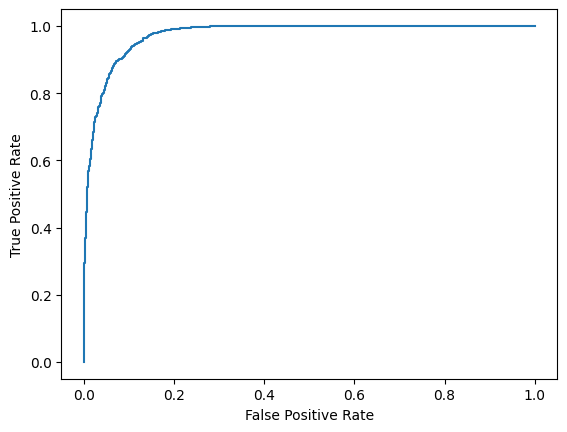

In [ ]:
y_prob = merged['probability'].tolist()
y_true = merged['toxic'].tolist()

# Plot ROC curve
plot_roc_curve(y_true, y_prob)

In [ ]:
# Calculate ROC AUC value
roc_auc = roc_auc_score(y_true, y_prob)
print(f'AUC-ROC score: {roc_auc}')

AUC-ROC score: 0.9737261123235723


In [ ]:
# Calculate Precision-Recall AUC
precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_prob)
pr_auc = auc(recall_vals, precision_vals)
print(f'Precision-Recall AUC: {pr_auc:}')

Precision-Recall AUC: 0.812096345893073


## Model 3: roBERTa (pretrained)

In [ ]:
# Have multiple models (original, unbiased, multilingual)
# Refer to model card: https://huggingface.co/unitary/unbiased-toxic-roberta
model = 'unbiased'

labels = []
for i in subset['comment_text']:
    result = Detoxify(model).predict(i)
    labels.append(result)
subset['toxic'] = labels
subset

Downloading: "https://github.com/unitaryai/detoxify/releases/download/v0.3-alpha/toxic_debiased-c7548aa0.ckpt" to /root/.cache/torch/hub/checkpoints/toxic_debiased-c7548aa0.ckpt
100%|██████████| 476M/476M [00:09<00:00, 54.6MB/s]


config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

,id,comment_text,probability,toxic
61720,f6cf005acedc8bd8,""" * risneger - (""""rice-nigger"""") in swedish, h...",0.728771,"{'toxicity': 0.8990634, 'severe_toxicity': 0.0..."
28679,72483f39d76b1288,"::yes, i agree with your reply message. on tha...",0.000593,"{'toxicity': 0.005680836, 'severe_toxicity': 3..."
46441,b8f568426b06a525,guðrún p. helgadóttir,0.001209,"{'toxicity': 0.0441061, 'severe_toxicity': 6.3..."
10767,2b232c23511f8230,== rfc == i do not think this is a good idea a...,0.000687,"{'toxicity': 0.005011934, 'severe_toxicity': 1..."
8341,219ee9643701ed3e,the nazi content in this article is at a very ...,0.001566,"{'toxicity': 0.006028129, 'severe_toxicity': 4..."
...,...,...,...,...
63247,fd07c031fb50a1e0,::bestiality was linked in the article (it was...,0.295853,"{'toxicity': 0.7791906, 'severe_toxicity': 0.0..."
39931,9f39c1d161a27a1d,brendon beskucho is a fag!!,0.936316,"{'toxicity': 0.9771689, 'severe_toxicity': 0.0..."
28349,710dc1106543779f,""" :surely it makes more sense to use the searc...",0.000841,"{'toxicity': 0.0008518513, 'severe_toxicity': ..."
26341,68e3c712cfd2ee57,[ banned through february 2012],0.000671,"{'toxicity': 0.0005550761, 'severe_toxicity': ..."


In [ ]:
subset.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/roBERTa/unbiased_roBERTa_label_jigsaw_test_prob.csv",index=False)

In [ ]:
# Extract the 'toxic' probability
subset['toxic'] = subset['toxic'].apply(lambda x: x['toxicity'])

In [ ]:
subset.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/roBERTa/unbiased_roBERTa_label_jigsaw_test.csv",index=False)

In [ ]:
results = subset.copy()
labels = df_truth.copy()
merged = pd.merge(results, labels, on='id', how='inner')

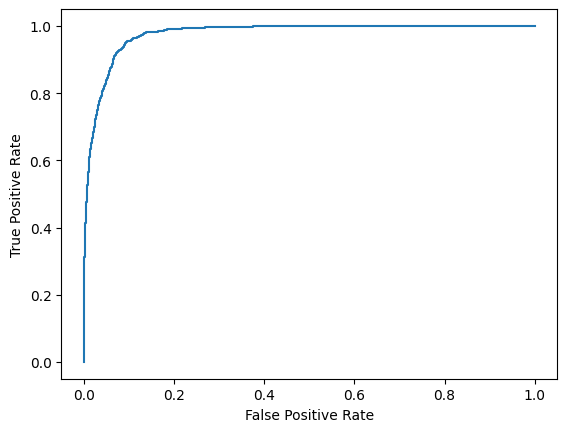

In [ ]:
y_prob = merged['toxic_x'].tolist()
y_true = merged['toxic_y'].tolist()

# Plot ROC curve
plot_roc_curve(y_true, y_prob)

In [ ]:
roc_auc = roc_auc_score(y_true, y_prob)
print(f'ROC AUC Score: {roc_auc:}')

ROC AUC Score: 0.9762890507451523


In [ ]:
precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_prob)
pr_auc = auc(recall_vals, precision_vals)
print(f'Precision-Recall AUC: {pr_auc:}')

Precision-Recall AUC: 0.829666335582548


## Model 4: dehate-bert (pretrained)

In [ ]:
# Load the tokenizer and model
model_name = "Hate-speech-CNERG/dehatebert-mono-english"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/152 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.23k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/872k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/669M [00:00<?, ?B/s]

In [ ]:
# Define a function to get probability scores for each comment
def get_toxicity_probability(text):
    # Tokenize and preprocess the text
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)

    # Perform inference
    outputs = model(**inputs)
    logits = outputs.logits

    # Convert logits to probabilities
    probs = torch.softmax(logits, dim=1).detach().numpy()[0]

    # Return probabilities for each class
    return probs[1]  # toxic probability

# Apply the function to each comment in the 'comment_text' column
subset['probability'] = subset['comment_text'].apply(get_toxicity_probability)

In [ ]:
print(subset.head())

                     id                                       comment_text  \
61720  f6cf005acedc8bd8  " * risneger - (""rice-nigger"") in swedish, h...   
28679  72483f39d76b1288  ::yes, i agree with your reply message. on tha...   
46441  b8f568426b06a525                              guðrún p. helgadóttir   
10767  2b232c23511f8230  == rfc == i do not think this is a good idea a...   
8341   219ee9643701ed3e  the nazi content in this article is at a very ...   

       probability  
61720     0.761182  
28679     0.030642  
46441     0.026407  
10767     0.025665  
8341      0.033952  


In [ ]:
# Save output to csv
subset.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/dehate-bert/dehatebert_kaggle.csv",index=False)

In [ ]:
results = subset.copy()
labels = df_truth.copy()

merged = pd.merge(results, labels, on='id', how='inner')

In [ ]:
y_prob = merged['probability'].tolist()
y_true = merged['toxic'].tolist()

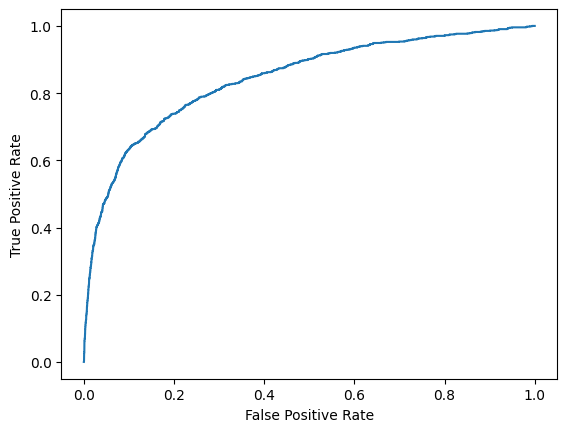

In [ ]:
# Plot ROC curve
plot_roc_curve(y_true, y_prob)

In [ ]:
roc_auc = roc_auc_score(y_true, y_prob)
print(f'AUC-ROC score: {roc_auc}')

AUC-ROC score: 0.8434124792932082


In [ ]:
precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_prob)
pr_auc = auc(recall_vals, precision_vals)
print(f'Precision-Recall AUC: {pr_auc:}')

Precision-Recall AUC: 0.4719013050732037


# Selected Model: roBERTa
Based on the ROC-AUC scores for all the models, we have selected roBERTa, the model with the highest score.



In [ ]:
chunk_size = 100000
roBERTa_label = pd.DataFrame()  # Initialize an empty DataFrame

# Read and concatenate chunks from the file
for chunk in pd.read_csv('/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/classification/model_output/roBERTa/unbiased_roBERTa_label_jigsaw_test.csv', chunksize=chunk_size, engine='python', on_bad_lines='warn', encoding='utf-8'):
  roBERTa_label = pd.concat([roBERTa_label, chunk], ignore_index=True)

# Check total number of rows
print(f"Total rows in combined data: {roBERTa_label.shape[0]}")

Total rows in combined data: 10000


## Determine threshold

In [ ]:
results = roBERTa_label.copy()
labels = df_truth.copy()
merged = pd.merge(results, labels, on='id', how='inner')

In [ ]:
true_labels = merged['toxic_y']
model_predictions = merged['toxic_x']

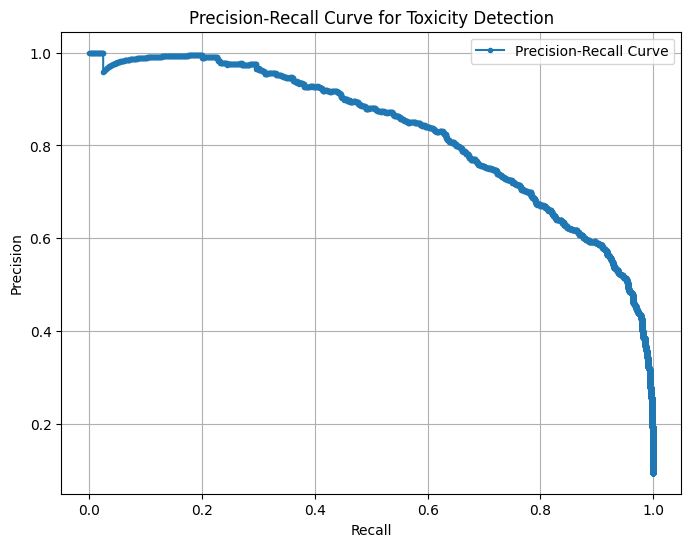

In [ ]:
# Compute precision, recall, and thresholds
precision, recall, thresholds = precision_recall_curve(true_labels, model_predictions)

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Toxicity Detection')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Determine optimal probability from precision recall curve
optimal_proba_cutoff = sorted(list(zip(np.abs(precision-recall), thresholds)), key=lambda i: i[0], reverse=False)[0][1]
optimal_proba_cutoff

0.93597454

# Labelling of Reddit Data (by threshold)

In [ ]:
combined_labelled_data = pd.read_csv('/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/reddit_sample_data/labelled_reddit_sample_total.csv', delimiter=",")

In [ ]:
combined_labelled_data['label'] = combined_labelled_data['label'].apply(lambda x: eval(x) if isinstance(x, str) else x)
combined_labelled_data['toxicity'] = combined_labelled_data['label'].apply(lambda x: x.get('toxicity'))

# Define the threshold
threshold = 0.93597454

# Create the binary 'toxic' column
combined_labelled_data['toxic'] = combined_labelled_data['toxicity'].apply(lambda x: 1 if x > threshold else 0)

# Display to verify
combined_labelled_data[['toxicity', 'toxic']].head(20)

,toxicity,toxic
0,0.000557,0
1,0.000777,0
2,0.000865,0
3,0.003373,0
4,0.002861,0
5,0.007741,0
6,0.011771,0
7,0.000427,0
8,0.001140,0
9,0.007519,0


In [ ]:
combined_labelled_data.to_csv("/content/drive/MyDrive/DSA4264 Group Project/dsa4264_datasets/reddit_sample_data/combined_reddit_labelled_data.csv",index=False)